# Snake classifier

Using data from https://www.kaggle.com/datasets/sameeharahman/preprocessed-snake-images

Adapted from https://colab.research.google.com/drive/1QCU_dCR0ozI8j6X2btEDCsaUk5p_b1uw?usp=sharing

# Import Libraries

In [ ]:
import os
import glob
import xml.etree.ElementTree as ET
import pandas as pd
import tensorflow as tf
print(tf.__version__)


2.8.0


## Create *`customTF2`*, *`training`* and *`data`* folders in your google drive
Create a folder named ***customTF2*** in your google drive.

Create another folder named ***training*** inside the ***customTF2*** folder
(***training*** folder is where the checkpoints will be saved during training)

Create another folder named ***data*** inside the ***customTF2*** folder.


# Create and upload your image files and xml files.
 Create a folder named ***images*** for your custom dataset images and create another folder named ***annotations*** for its corresponding xml files.
 
 Next, create their zip files and upload them to the ***customTF2*** folder in your drive.

 
 (Make sure all the image files have extension as ".jpg" only.
 Other formats like ".png" , ".jpeg" or even ".JPG" will give errors since the generate_tfrecord and xml_to_csv scripts here have only ".jpg" in them)








### Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Clone the tensorflow models git repository & Install TensorFlow Object Detection API



In [ ]:
# clone the tensorflow models on the colab cloud vm
!git clone --q https://github.com/tensorflow/models.git

#navigate to /models/research folder to compile protos
%cd models/research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .


/content/models/research
Processing /content/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 10.1 MB 17.9 MB/s 
     |████████████████████████████████| 352 kB 77.3 MB/s 
     |████████████████████████████████| 2.2 MB 87.7 MB/s 
     |████████████████████████████████| 23.4 MB 232 kB/s 
     |████████████████████████████████| 237 kB 72.7 MB/s 
     |████████████████████████████████| 1.1 MB 63.4 MB/s 
     |████████████████████████████████| 90 kB 14.0 MB/s 
     |████████████████████████████████| 47.8 MB 1.1 MB/s 
     |████████████████████████████████| 99 kB 11.8 MB/s 
     |████████████████

# Test the model builder


In [ ]:
# testing the model builder
!python object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2022-04-08 15:07:30.368857: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0408 15:07:30.847615 139770128013184 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 3.28s
I0408 15:07:31.162572 139770128013184 test_util.py:2374] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 3.28s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.63s
I0408 15:07:31.794391 139770128013184 test

# Create the CSV files and the "label_map.pbtxt" file

Run xml_to_csv script below to create ***test_labels.csv*** and ***train_labels.csv***

This also creates the ***label_map.pbtxt*** file using the classes mentioned in the xml files. 

In [ ]:
%cd /content/drive/MyDrive/tech/snakes/data/
%pwd

/content/drive/MyDrive/tech/snakes/data


'/content/drive/MyDrive/tech/snakes/data'

In [ ]:
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text  ,   
               int(root.find('size')[0].text),
               int(root.find('size')[1].text),
               member[0].text,
               int(member[4][0].text),
               int(member[4][1].text),
               int(member[4][2].text),
               int(member[4][3].text))
      xml_list.append(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name) 
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

In [ ]:
label_path = 'train_annotations'

image_path = os.path.join(os.getcwd(), label_path)
xml_df, classes = xml_to_csv(label_path)
xml_df.to_csv(f'{label_path}.csv', index=None)
print(f'Successfully converted {label_path} xml to csv.')

Successfully converted train_annotations xml to csv.


In [ ]:
label_path = 'test_annotations'

image_path = os.path.join(os.getcwd(), label_path)
xml_df, classes = xml_to_csv(label_path)
xml_df.to_csv(f'{label_path}.csv', index=None)
print(f'Successfully converted {label_path} xml to csv.')

Successfully converted test_annotations xml to csv.


In [ ]:
label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt ')   

Successfully created label_map.pbtxt 


# Create train.record & test.record files

Current working directory is /mydrive/customTF2/data/

Run the *generate_tfrecord.py* script to create *train.record* and *test.record* files



In [ ]:
#Usage:  
#!python generate_tfrecord.py output.csv output_pb.txt /path/to/images output.tfrecords

#For train.record
!python /content/drive/MyDrive/tech/snakes/generate_tfrecord.py /content/drive/MyDrive/tech/snakes/data/train_annotations.csv /content/drive/MyDrive/tech/snakes/data/label_map.pbtxt /content/drive/MyDrive/tech/snakes/data/train_images/ /content/drive/MyDrive/tech/snakes/data/train.record

#For test.record
!python /content/drive/MyDrive/tech/snakes/generate_tfrecord.py /content/drive/MyDrive/tech/snakes/data/test_annotations.csv /content/drive/MyDrive/tech/snakes/data/label_map.pbtxt /content/drive/MyDrive/tech/snakes/data/test_images/ /content/drive/MyDrive/tech/snakes/data/test.record


groups: 100% 500/500 [06:45<00:00,  1.23it/s]
Successfully created the TFRecords: /content/drive/MyDrive/tech/snakes/data/train.record
groups: 100% 100/100 [01:17<00:00,  1.29it/s]
Successfully created the TFRecords: /content/drive/MyDrive/tech/snakes/data/test.record


# Download pre-trained model checkpoint

A list of detection checkpoints for tensorflow 2.x can be found [here](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).



In [ ]:
pwd

'/content/drive/MyDrive/tech/snakes/data'

In [ ]:
#Download the pre-trained model into the data folder & unzip it.

# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
# !tar -xzvf faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

--2022-04-07 16:16:24--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.125.128, 2404:6800:4008:c13::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.125.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.17M   118MB/s    in 1.7s    

2022-04-07 16:16:26 (118 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]

faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/checkpoint
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/c

# Get the model pipeline config file, make changes to it and put it inside the *data* folder

Current working directory is /mydrive/customTF2/data/

Download the pipeline config from ***/content/models/research/object_detection/configs/tf2***. Make the required changes to it and upload it to the ***/mydrive/custom/data*** folder.





# **14) Load Tensorboard**

In [ ]:
#load tensorboard

%load_ext tensorboard         
# !kill 2423
# %reload_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/tech/snakes/training'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 2474), started 0:00:07 ago. (Use '!kill 2474' to kill it.)

<IPython.core.display.Javascript object>

# Train the model






## Navigate to the ***object_detection*** folder in colab vm


In [ ]:
%cd /content/models/research/object_detection

/content/models/research/object_detection


In [ ]:
!pip uninstall opencv-python-headless
!pip install opencv-python-headless==4.1.2.30

Found existing installation: opencv-python-headless 4.5.5.64
Uninstalling opencv-python-headless-4.5.5.64:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.5.5.64.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-65fa80df.so.58.134.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-8ef5c7db.so.58.76.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavutil-9c768859.so.56.70.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libbz2-a273e504.so.1.0.6
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libcrypto-09fe7800.so.1.1
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libgfortran-91cc3cb1.so.3.0.0
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libopenblas-r0-f650aae0.3.3.so
    /usr/local/lib/python3.7/dis

## Training using model_main_tf2.py

Here **{PIPELINE_CONFIG_PATH}** points to the pipeline config and **{MODEL_DIR}** points to the directory in which training checkpoints and events will be written.

In [ ]:
# Run the command below from the content/models/research/object_detection directory
"""
PIPELINE_CONFIG_PATH=path/to/pipeline.config
MODEL_DIR=path to training checkpoints directory
NUM_TRAIN_STEPS=50000
SAMPLE_1_OF_N_EVAL_EXAMPLES=1

python model_main_tf2.py -- \
  --model_dir=$MODEL_DIR --num_train_steps=$NUM_TRAIN_STEPS \
  --sample_1_of_n_eval_examples=$SAMPLE_1_OF_N_EVAL_EXAMPLES \
  --pipeline_config_path=$PIPELINE_CONFIG_PATH \
  --alsologtostderr
"""

!python model_main_tf2.py --pipeline_config_path=/content/drive/MyDrive/tech/snakes/data/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/pipeline.config --model_dir=/content/drive/MyDrive/tech/snakes/training --alsologtostderr

2022-04-08 16:14:48.037729: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0408 16:14:48.044446 139895204276096 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I0408 16:14:48.049644 139895204276096 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0408 16:14:48.049831 139895204276096 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0408 16:14:48.084913 139895204276096 deprecation.py:343] From /usr/local/lib/python3.7/dist-packages/object_detection/model_lib_v2.py:564: StrategyBase.experiment

# Test trained model

## Export inference graph

Current working directory is /content/models/research/object_detection

In [ ]:
##Export inference graph
!python exporter_main_v2.py --trained_checkpoint_dir=/content/drive/MyDrive/tech/snakes/training --pipeline_config_path=/content/drive/MyDrive/tech/snakes/data/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/pipeline.config --output_directory=/content/drive/MyDrive/tech/snakes/data/inference_graph

2022-04-08 20:47:12.308093: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0408 20:47:12.564563 140259714512768 deprecation.py:615] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:458: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
INFO:tensorflow:depth of addition

## Test your trained Object Detection model on images

Current working directory is /content/models/research/object_detection

In [ ]:
# Different font-type for labels text.(This step is optional)
!wget https://freefontsdownload.net/download/160187/arial.zip
!unzip arial.zip -d .

%cd utils/
!sed -i "s/font = ImageFont.truetype('arial.ttf', 24)/font = ImageFont.truetype('arial.ttf', 50)/" visualization_utils.py
%cd ..

--2022-04-08 19:59:13--  https://freefontsdownload.net/download/160187/arial.zip
Resolving freefontsdownload.net (freefontsdownload.net)... 104.21.75.182, 172.67.180.27, 2606:4700:3037::ac43:b41b, ...
Connecting to freefontsdownload.net (freefontsdownload.net)|104.21.75.182|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 172804 (169K) [application/force-download]
Saving to: ‘arial.zip’

arial.zip           100%[===================>] 168.75K   435KB/s    in 0.4s    

2022-04-08 19:59:14 (435 KB/s) - ‘arial.zip’ saved [172804/172804]

Archive:  arial.zip
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@#################################@
@#        Downloaded from        #@
@#                               #@
@#   www.FreeFontsDownload.net   #@
@#                               #@
@# ---------- More site -------- #@
@#      https://funnytv.net      #@
@#                               #@
@#                               #@
@#################################@
@@@@@@@@@@@@@@@@@@@

Loading model...Done!


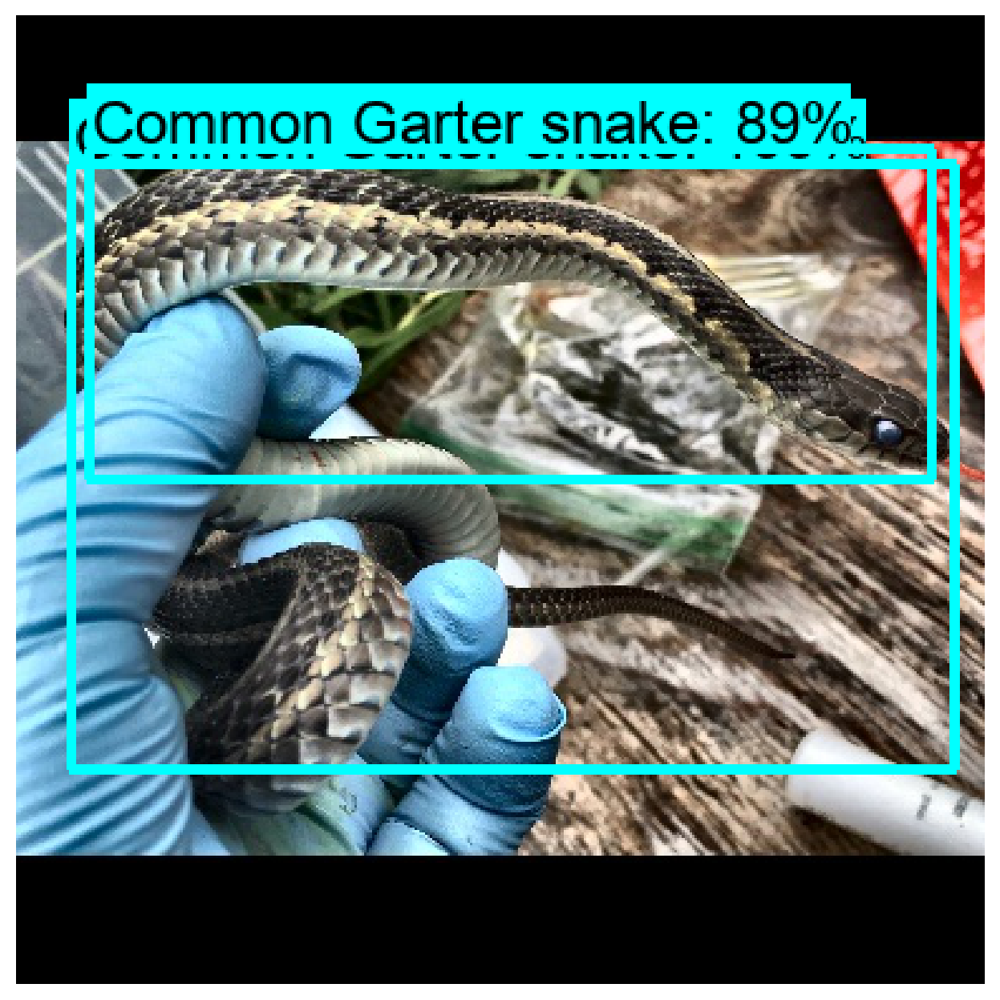

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (12, 8) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/content/drive/MyDrive/tech/snakes/data/inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/content/drive/MyDrive/tech/snakes/data/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/drive/MyDrive/tech/snakes/data/test_images/0002a258e95d10837e9574d808c2048c.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.85, # Adjust this value to set the minimum probability boxes to be classified as True
      agnostic_mode=False)
%matplotlib inline
plt.figure(figsize=IMAGE_SIZE, dpi=200)
plt.axis("off")
plt.imshow(image_np_with_detections)
plt.show()

Loading model... Done!


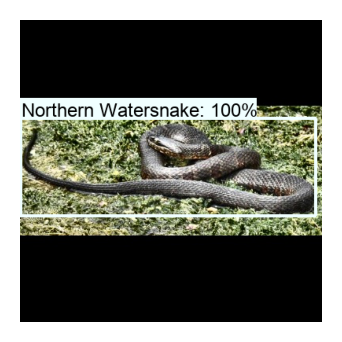

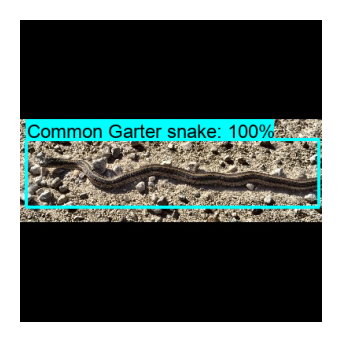

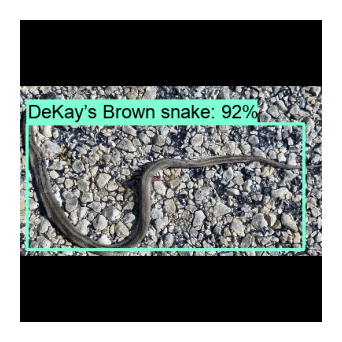

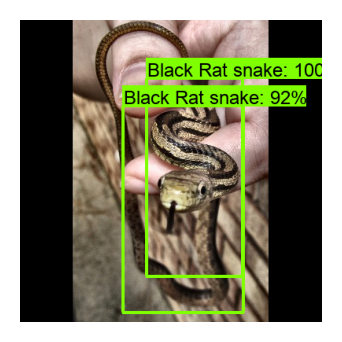

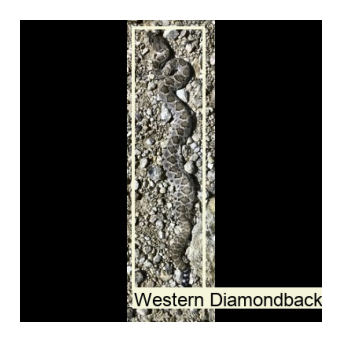

In [53]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (3, 2)
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

PATH_TO_SAVED_MODEL="/content/drive/MyDrive/tech/snakes/data/inference_graph/saved_model"
print('Loading model... ', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/content/drive/MyDrive/tech/snakes/data/label_map.pbtxt",use_display_name=True)

def load_image_into_numpy_array(path):
    return np.array(Image.open(path))

def run_detection(image):
    image_np = load_image_into_numpy_array(image)
      
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)

    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                  for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=4,
        min_score_thresh=.90, # Adjust this value to set the minimum probability boxes to be classified as True
        agnostic_mode=False)
    
    return image_np_with_detections

images = [
  "/content/drive/MyDrive/tech/snakes/data/test_images/01e8cf343bd65e39090dd79ec6965026.jpg",
  "/content/drive/MyDrive/tech/snakes/data/test_images/1ec357ad013d883e269e04d703449d2c.jpg",
  "/content/drive/MyDrive/tech/snakes/data/test_images/0ec0b711420139371ad80027683b4a68.jpg",
  "/content/drive/MyDrive/tech/snakes/data/test_images/0ada89a89d77f15acfdb5ac20c1512b4.jpg",
  "/content/drive/MyDrive/tech/snakes/data/test_images/ff0ff6b1d3da0d1d7502d0186aa9df98.jpg"
]

%matplotlib inline

for image in images:
    image_to_print = run_detection(image)
    plt.figure(figsize=IMAGE_SIZE, dpi=200)
    plt.axis("off")
    plt.imshow(image_to_print)
    plt.show()
